['GRBALPHA_20241017T082528_pickled.bin', 'GRBALPHA_20241017T224535_pickled.bin', 'GRBALPHA_20241018T001903_pickled.bin', 'GRBALPHA_20241018T110034_pickled.bin', 'GRBALPHA_20241018T221326_pickled.bin', 'GRBALPHA_20241018T234627_pickled.bin', 'GRBALPHA_20241019T085324_pickled.bin', 'GRBALPHA_20241019T102657_pickled.bin', 'GRBALPHA_20241019T214126_pickled.bin', 'GRBALPHA_20241020T224123_pickled.bin', 'GRBALPHA_20241022T230911_pickled.bin', 'GRBALPHA_20241023T094901_pickled.bin', 'GRBALPHA_20241024T105037_pickled.bin', 'GRBALPHA_20241025T230331_pickled.bin', 'GRBALPHA_20241026T223029_pickled.bin', 'GRBALPHA_20241027T000340_pickled.bin', 'GRBALPHA_20241027T233012_pickled.bin', 'GRBALPHA_20241028T083709_pickled.bin', 'GRBALPHA_20241028T100958_pickled.bin', 'GRBALPHA_20241028T225645_pickled.bin', 'GRBALPHA_20241029T003018_pickled.bin', 'GRBALPHA_20241030T090242_pickled.bin', 'GRBALPHA_20241030T103630_pickled.bin', 'GRBALPHA_20241030T232232_pickled.bin', 'GRBALPHA_20241031T005632_pickled.bin',

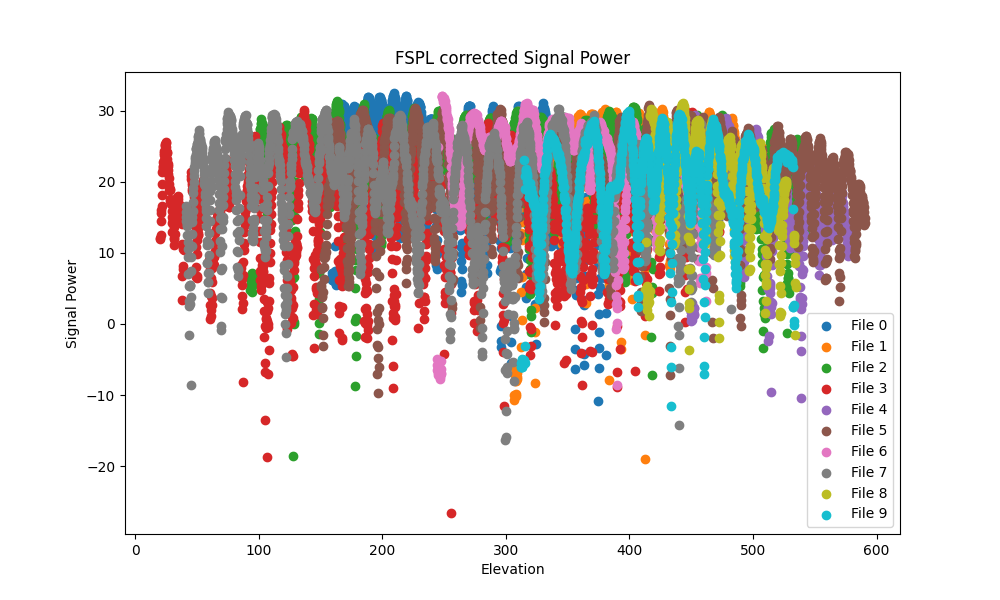

In [1]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import noisy_moose as nm
import pickle
import os
from multiprocessing import Pool
import datetime

data_files_active = os.listdir("../no_waterfall/active/")
print(data_files_active)
# data_files_inactive = os.listdir("no_waterfall/inactive/")
grbalpha_active = list(i for i in data_files_active if "GRBALPHA" in i)
# grbalpha_inactive = list(i for i in data_files_inactive if "GRBALPHA" in i)
# uvsq_inactive = list(i for i in data_files_inactive if "UVSQ" in i)

obj_act: list[nm.prepping] = [] #: list[nm.prepping] = [] means that the variable is a list of nm.prepping objects, which makes it possible to autocomplete the methods and attributes of the nm.prepping class.

for i in grbalpha_active:
    with open("../no_waterfall/active/" + i, 'rb') as f:
        obj_act.append(pickle.loads(f.read()))

# pointing error calculation

def calculate_pointing_error(set_azimuth, set_elevation, azimuth, elevation):
    """
    Calculate the pointing error given reference (set) and measured azimuth and elevation.
    
    Parameters:
        set_azimuth (array-like): Reference azimuth values in degrees.
        set_elevation (array-like): Reference elevation values in degrees.
        azimuth (array-like): Measured azimuth values in degrees.
        elevation (array-like): Measured elevation values in degrees.
    
    Returns:
        np.ndarray: Pointing error for each pair of reference and measured angles in degrees.
    """
    # Convert degrees to radians
    set_azimuth_rad = np.radians(set_azimuth)
    set_elevation_rad = np.radians(set_elevation)
    azimuth_rad = np.radians(azimuth)
    elevation_rad = np.radians(elevation)
    
    # Compute the pointing error using the great-circle distance formula
    pointing_error_rad = np.arccos(
        np.sin(set_elevation_rad) * np.sin(elevation_rad) +
        np.cos(set_elevation_rad) * np.cos(elevation_rad) * np.cos(azimuth_rad - set_azimuth_rad)
    )
    
    # Convert the pointing error back to degrees
    pointing_error_deg = np.degrees(pointing_error_rad)
    return pointing_error_deg


for i, obj in enumerate(obj_act):
    obj.station_obj.convert_timestamp() #converts the timestamps for the station object to numpy array

    #Thresholding by moving average
    window_size = 100

    # Pad the signal symmetrically with NaNs (or a constant like -130 to match your data)
    padded_signal = np.pad(10 * np.log10(obj.noise_obj.signal_abs), (50, 49), mode='constant', constant_values=-150)

    # Perform convolution in 'valid' mode
    moving_avg = np.convolve(padded_signal, np.ones(window_size)/window_size, mode='valid')

    idx = np.argwhere(moving_avg > -138) #Threshold set to -138 dBm
    obj_act[i]=obj[idx] #Basically deleting all the points where the moving average is below the threshold
    
    obj=obj_act[i] #for calculating Pointing error
    # Calculate pointing error for this object
    pointing_error = calculate_pointing_error(
        set_azimuth=obj.station_obj.set_azimuth,
        set_elevation=obj.station_obj.set_elevation,
        azimuth=obj.station_obj.azimuth,
        elevation=obj.station_obj.elevation
    )
    # Append the pointing error as a new attribute to the object
    obj_act[i].pointing_error = pointing_error
    
# Plot the first feature (e.g., signal power) for some files
plt.figure(figsize=(10, 6))
for i in range(10):
    plt.scatter(obj_act[i].time_ax,obj_act[i].clean_sig_abs, label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Elevation')
plt.ylabel('Signal Power')
plt.title('FSPL corrected Signal Power')
plt.legend()
plt.show()

# interesting attributes

obj_act[i].time_ax

obj_act[i].clean_sig_abs

obj_act[i].pointing_error

obj_act[i].station_obj.azimuth

obj_act[i].station_obj.elevation

obj_act[i].station_obj.fspl

obj_act[i].noise_obj.noise

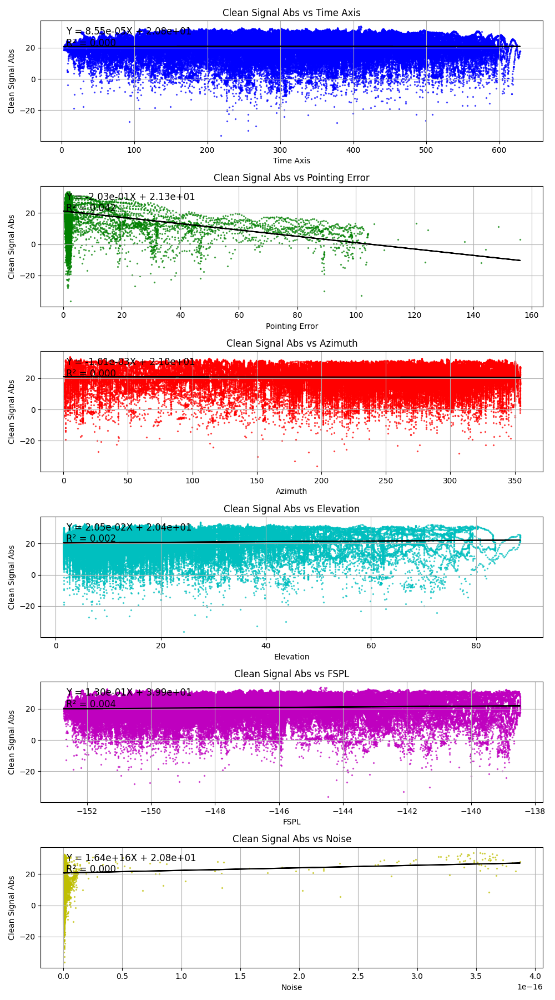

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize plots for all features
fig, axs = plt.subplots(6, 1, figsize=(10, 18), sharex=False)

# Titles for each plot
titles = [
    'Clean Signal Abs vs Time Axis',
    'Clean Signal Abs vs Pointing Error',
    'Clean Signal Abs vs Azimuth',
    'Clean Signal Abs vs Elevation',
    'Clean Signal Abs vs FSPL',
    'Clean Signal Abs vs Noise'
]

# Colors for points
colors = ['b', 'g', 'r', 'c', 'm', 'y']

# Initialize empty lists to aggregate all the data
y_vals_all = []

# Initialize y_vals_all with empty lists for each feature
x_vals_all = [[] for _ in range(6)]

# Loop through objects and add points to each plot
for obj in obj_act:
    # Collecting all data into the aggregated lists
    y_vals_all.extend(obj.clean_sig_abs)
    
    # For each plot, collect the corresponding feature as y-values
    x_vals_all[0].extend(obj.time_ax)  # For Time Axis
    x_vals_all[1].extend(obj.pointing_error)  # For Pointing Error
    x_vals_all[2].extend(obj.station_obj.azimuth)  # For Azimuth
    x_vals_all[3].extend(obj.station_obj.elevation)  # For Elevation
    x_vals_all[4].extend(obj.station_obj.fspl)  # For FSPL
    x_vals_all[5].extend(obj.noise_obj.noise)  # For Noise

# Now we go through each plot and add a trendline based on the aggregated data
for i, ax in enumerate(axs):
    # Retrieve the feature values for this plot
    y_vals = np.array(y_vals_all).flatten()  # Flatten the list for the current feature
    
    # Convert x_vals_all into a numpy array and flatten it
    x_vals = np.array(x_vals_all[i]).flatten()
    # print(x_vals.shape)
    # print(y_vals.shape)

    # Fit a linear trendline (polynomial degree 1) to the data
    p = np.polyfit(x_vals, y_vals, 1)
    trendline = np.poly1d(p)
    
    # Plot the aggregated points and trendline
    ax.scatter(x_vals, y_vals, alpha=0.6,s=2, color=colors[i], label=f'All Data {titles[i]}')
    ax.plot(x_vals, trendline(x_vals), color='black', label='Trendline')

    # Calculate R-squared
    y_pred = trendline(x_vals)
    residuals = y_vals - y_pred
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y_vals - np.mean(y_vals))**2)
    r2 = 1 - (ss_res / ss_tot)

    # Display the trendline equation and R-squared on the plot
    ax.text(0.05, 0.95, f'Y = {p[0]:.2e}X + {p[1]:.2e}\nR² = {r2:.3f}', transform=ax.transAxes,
            fontsize=12, verticalalignment='top', color='black')

# Customize plots
for i, ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.set_xlabel(titles[i].split('vs ')[1])
    ax.set_ylabel('Clean Signal Abs')  # Extract feature name for ylabel
    ax.grid(True)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


(127587,)
(127587,)


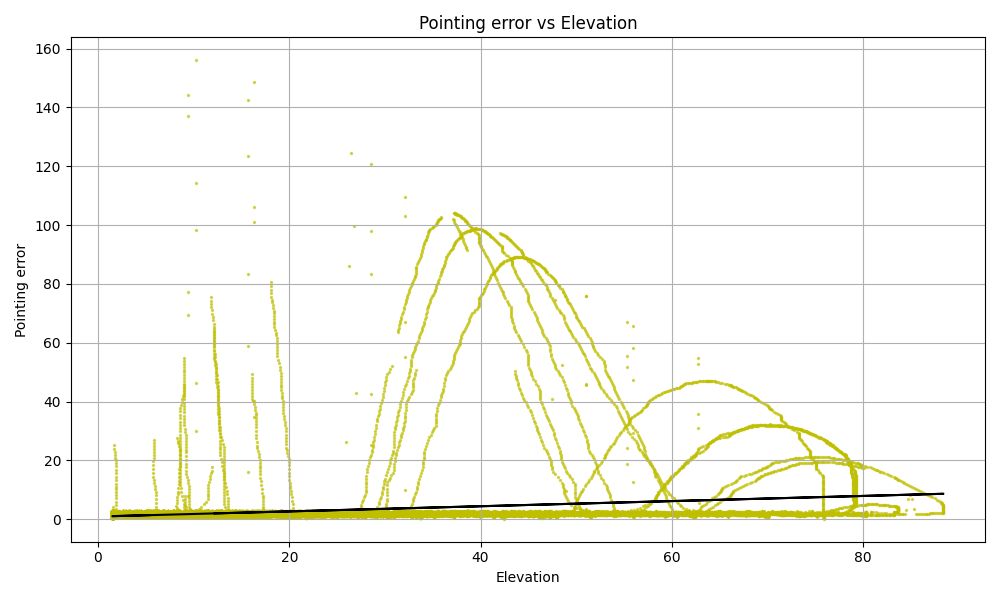

In [3]:
# Loop through objects and add points to each plot
x_vals_all = []
y_vals_all = []

for obj in obj_act:
    y_vals_all.extend(obj.pointing_error)
    x_vals_all.extend(obj.station_obj.elevation)


# Retrieve the feature values for this plot
y_vals = np.array(y_vals_all).flatten()  # Flatten the list for the current feature

# Convert x_vals_all into a numpy array and flatten it
x_vals = np.array(x_vals_all).flatten()
print(x_vals.shape)
print(y_vals.shape)

# Fit a linear trendline (polynomial degree 1) to the data
p = np.polyfit(x_vals, y_vals, 1)
trendline = np.poly1d(p)

# Plot the aggregated points and trendline
plt.figure(figsize=(10, 6))
plt.scatter(x_vals, y_vals, alpha=0.6,s=2, color=colors[i], label=f'All Data {titles[i]}')
plt.plot(x_vals, trendline(x_vals), color='black', label='Trendline')
plt.title('Pointing error vs Elevation')
plt.xlabel('Elevation')
plt.ylabel('Pointing error')  # Extract feature name for ylabel
plt.grid(True)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


In [4]:
# Step 1: Calculate mean pointing error for each object
meanpoint = [np.mean(obj.pointing_error) for obj in obj_act]  # List of mean pointing errors for all objects

# Step 2: Get the indices of the 10 largest mean pointing errors
top_10_indices = np.argsort(meanpoint)[-10:]  # Indices of the 10 largest values (sorted in ascending order, so we take the last 10)

# Step 3: Retrieve the objects with the 10 largest mean pointing errors
top_10_objects = [obj_act[i] for i in top_10_indices]  # List of the 10 objects with the largest mean pointing errors

# Optionally, display the mean pointing errors for these top 10 objects
for i, obj in enumerate(top_10_objects):
    print(f"Object {i+1}: {meanpoint[top_10_indices[i]]:.2f} , at index {top_10_indices[i]}")



Object 1: 3.40 , at index 60
Object 2: 3.50 , at index 64
Object 3: 4.22 , at index 78
Object 4: 4.83 , at index 13
Object 5: 4.99 , at index 42
Object 6: 5.35 , at index 37
Object 7: 8.37 , at index 10
Object 8: 9.05 , at index 31
Object 9: 9.26 , at index 55
Object 10: 9.83 , at index 74


['GRBALPHA_20241112T233453', 'GRBALPHA_20241113T225905', 'GRBALPHA_20241118T230433', 'GRBALPHA_20241025T230331', 'GRBALPHA_20241105T230254', 'GRBALPHA_20241104T091807', 'GRBALPHA_20241022T230911', 'GRBALPHA_20241102T231327', 'GRBALPHA_20241110T231310', 'GRBALPHA_20241117T092216']
['GRBALPHA_20241017T082528_pickled.bin', 'GRBALPHA_20241017T224535_pickled.bin', 'GRBALPHA_20241018T001903_pickled.bin', 'GRBALPHA_20241018T110034_pickled.bin', 'GRBALPHA_20241018T221326_pickled.bin', 'GRBALPHA_20241018T234627_pickled.bin', 'GRBALPHA_20241019T085324_pickled.bin', 'GRBALPHA_20241019T102657_pickled.bin', 'GRBALPHA_20241019T214126_pickled.bin', 'GRBALPHA_20241020T224123_pickled.bin', 'GRBALPHA_20241022T230911_pickled.bin', 'GRBALPHA_20241023T094901_pickled.bin', 'GRBALPHA_20241024T105037_pickled.bin', 'GRBALPHA_20241025T230331_pickled.bin', 'GRBALPHA_20241026T223029_pickled.bin', 'GRBALPHA_20241027T000340_pickled.bin', 'GRBALPHA_20241027T233012_pickled.bin', 'GRBALPHA_20241028T083709_pickled.bin'

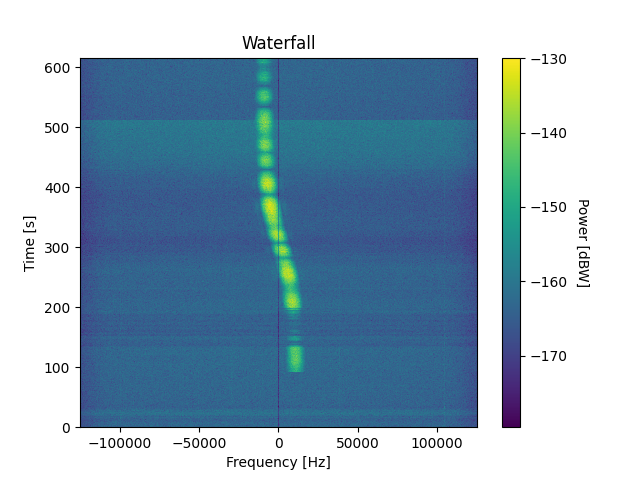

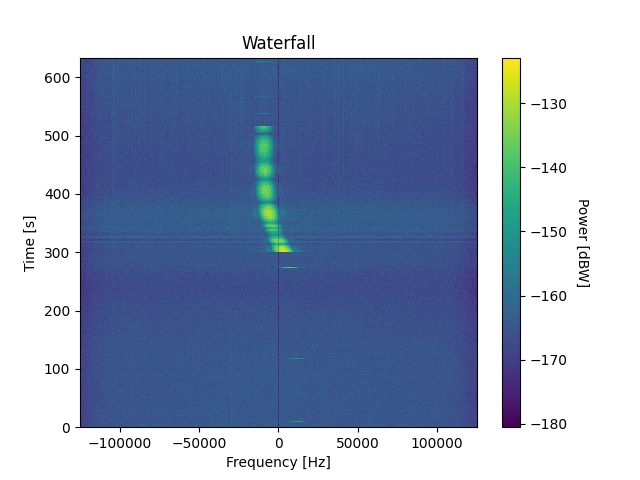

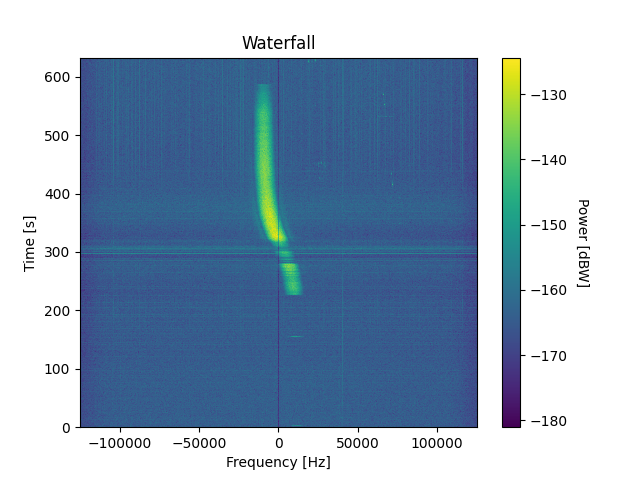

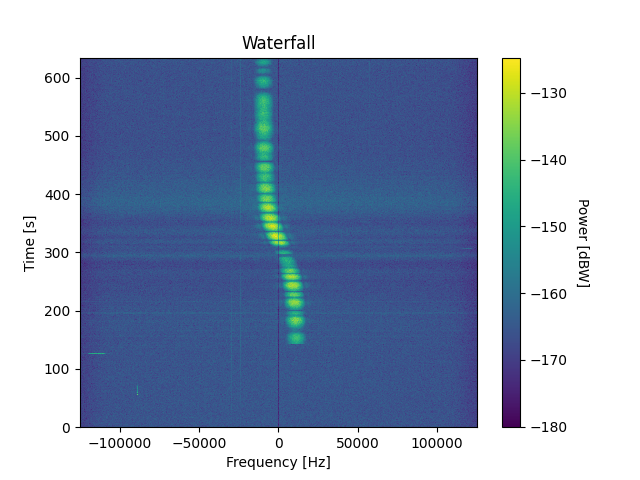

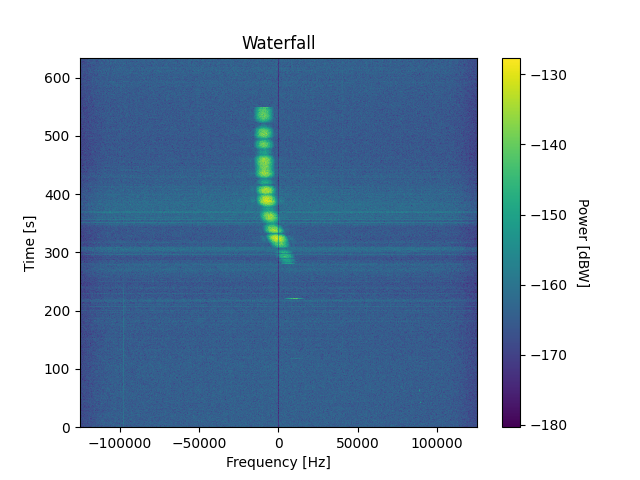

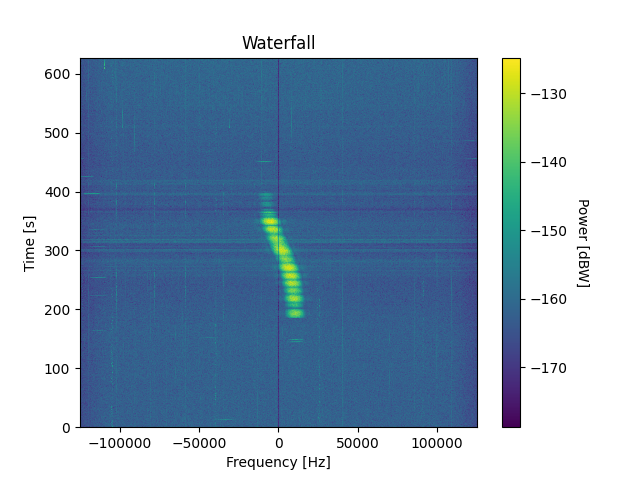

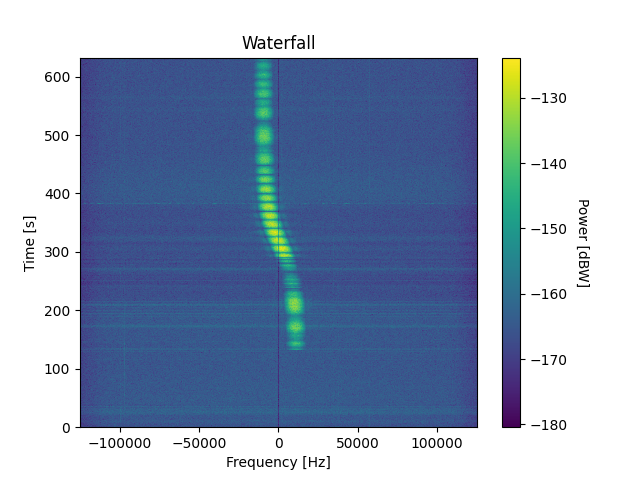

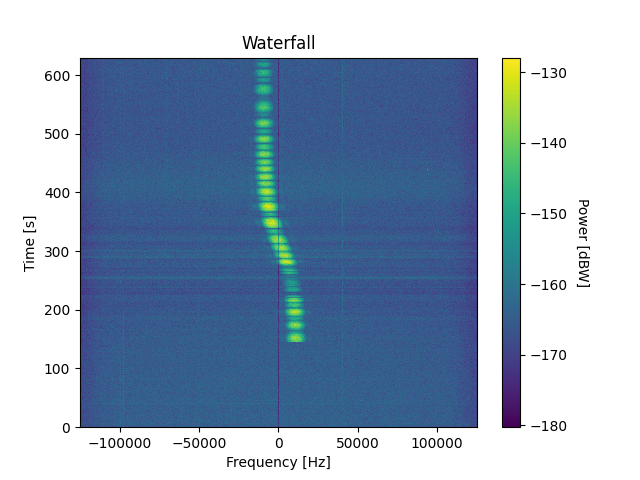

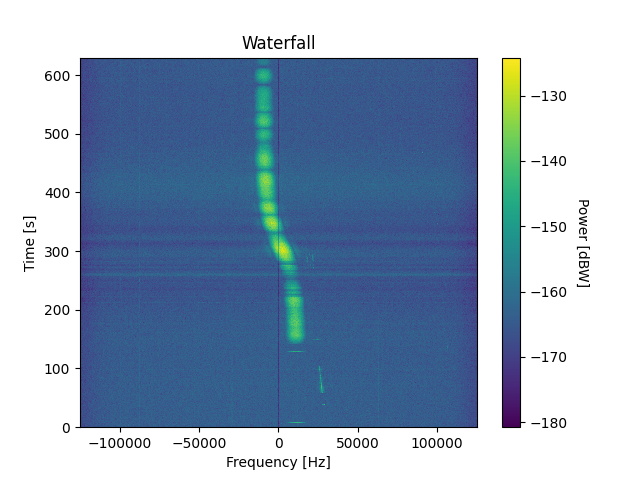

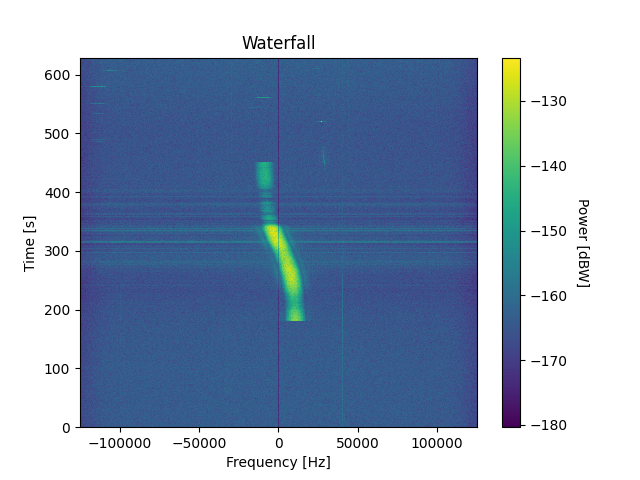

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import noisy_moose as nm
import pickle
import os
from multiprocessing import Pool

# List to store the objects corresponding to the top 10 indices
obj_act_top10: list[nm.prepping] = []

# Get the filenames of the top 10 objects using the top_10_indices
top_10_filenames = [obj_act[i].filename for i in top_10_indices]
print(top_10_filenames)
# List all files in the directory
data_files_active_water = os.listdir("../waterfall/active")

# Filter out the relevant files for GRBALPHA
grbalpha_active_water = [i for i in data_files_active_water if "GRBALPHA" in i]
print(grbalpha_active_water)

# Iterate over the top 10 filenames and open the corresponding files
for filename in top_10_filenames:
    if filename+'_pickled.bin' in grbalpha_active_water:  # Check if the file exists in the list of active files
        with open("../waterfall/active/" + filename + "_pickled.bin", 'rb') as f:
            obj_act_top10.append(pickle.loads(f.read()))  # Load the file and append the object to the list

# Now obj_act_top10 contains the loaded objects corresponding to the top 10 mean pointing errors
print(filename+'_pickled.bin')

def work(obj: nm.prepping):
    plt.figure()
    obj.noise_obj.plot_waterfall()
    print(obj.filename)
    
for obj in obj_act_top10:
    work(obj)

# if __name__ == "__main__":
#     with Pool(10) as pool:
#         pool.map(work, obj_act_top10)


print(obj_act_top10)

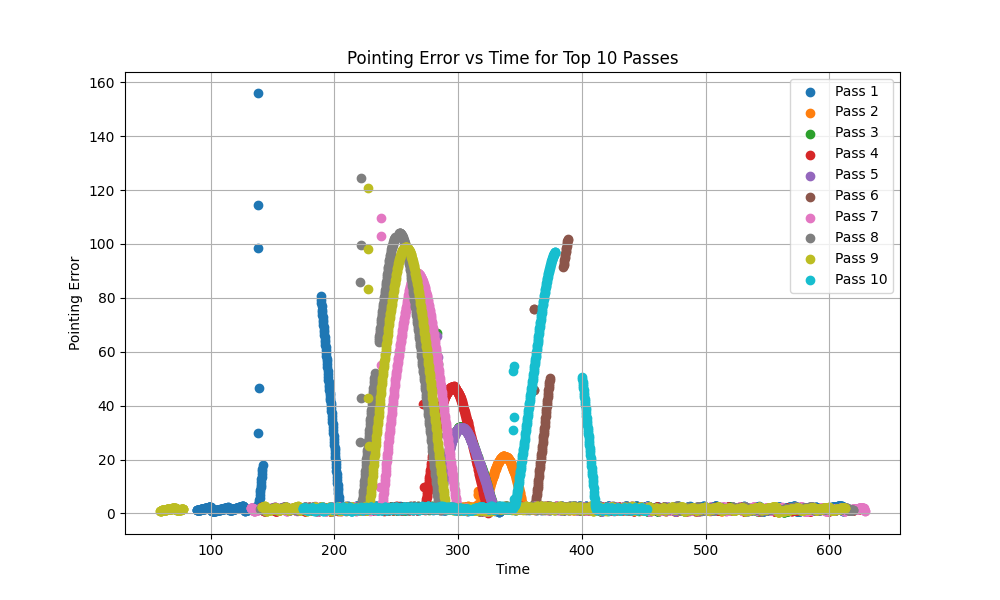

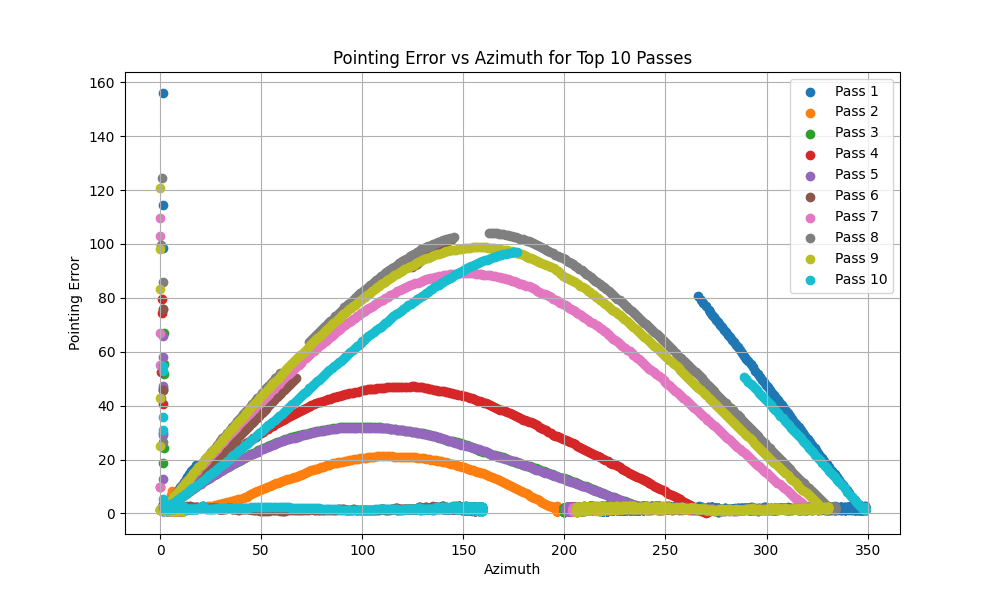

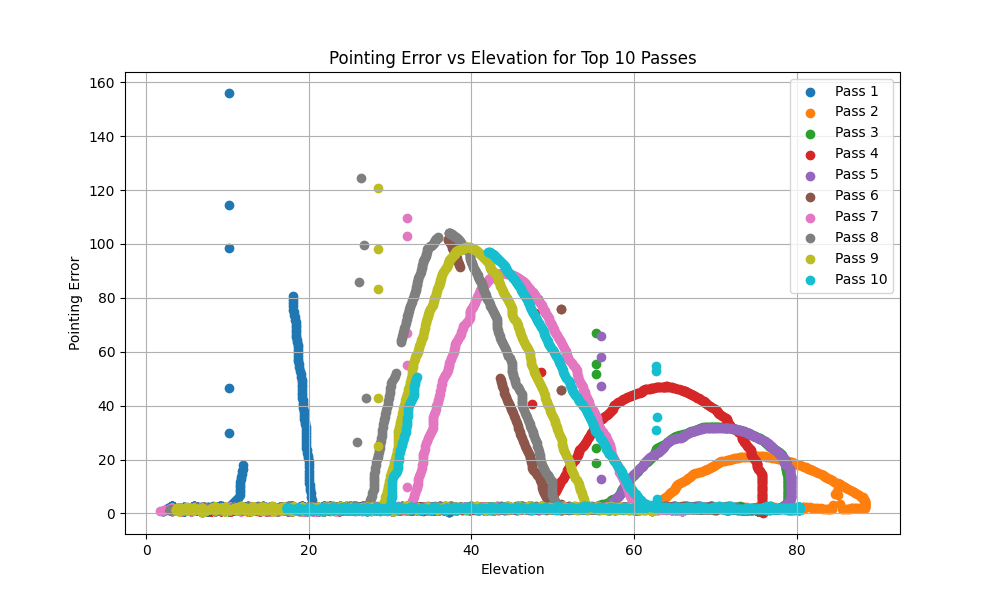

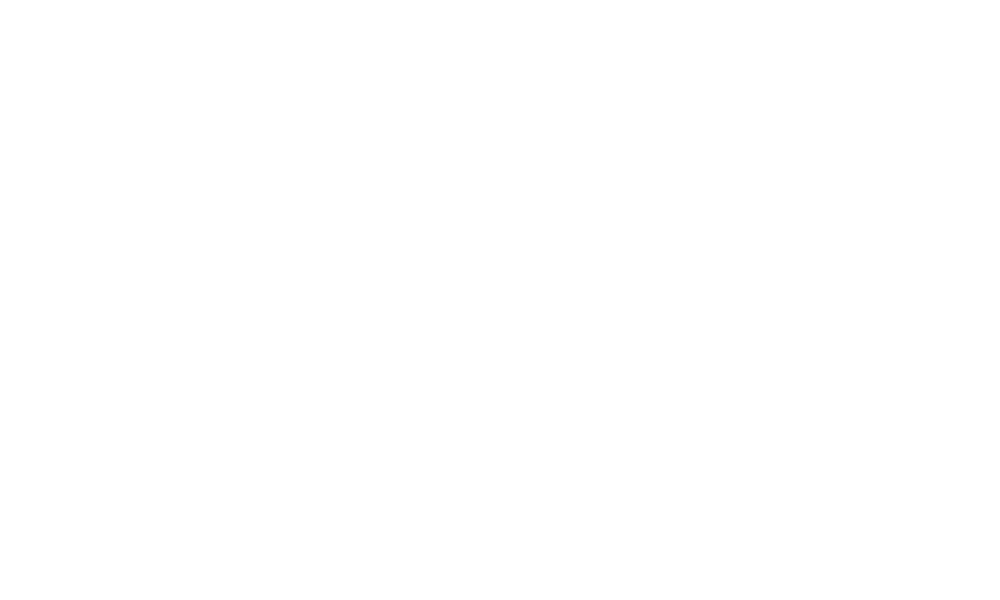

In [18]:
plt.figure(figsize=(10, 6))

# Loop through the top 10 objects and plot the pointing error vs elevation
for i, obj in enumerate(top_10_objects):
    plt.scatter(obj.time_ax, obj.pointing_error, label=f'Pass {i+1}')

plt.xlabel('Time')
plt.ylabel('Pointing Error')
plt.title('Pointing Error vs Time for Top 10 Passes')
plt.legend()
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 6))

plt.figure(figsize=(10, 6))
# Loop through the top 10 objects and plot the pointing error vs elevation
for i, obj in enumerate(top_10_objects):
    plt.scatter(obj.station_obj.azimuth, obj.pointing_error, label=f'Pass {i+1}')

plt.xlabel('Azimuth')
plt.ylabel('Pointing Error')
plt.title('Pointing Error vs Azimuth for Top 10 Passes')
plt.legend()
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))
# Loop through the top 10 objects and plot the pointing error vs elevation
for i, obj in enumerate(top_10_objects):
    plt.scatter(obj.station_obj.elevation, obj.pointing_error, label=f'Pass {i+1}')

plt.xlabel('Elevation')
plt.ylabel('Pointing Error')
plt.title('Pointing Error vs Elevation for Top 10 Passes')
plt.legend()
plt.grid(True)
plt.show()


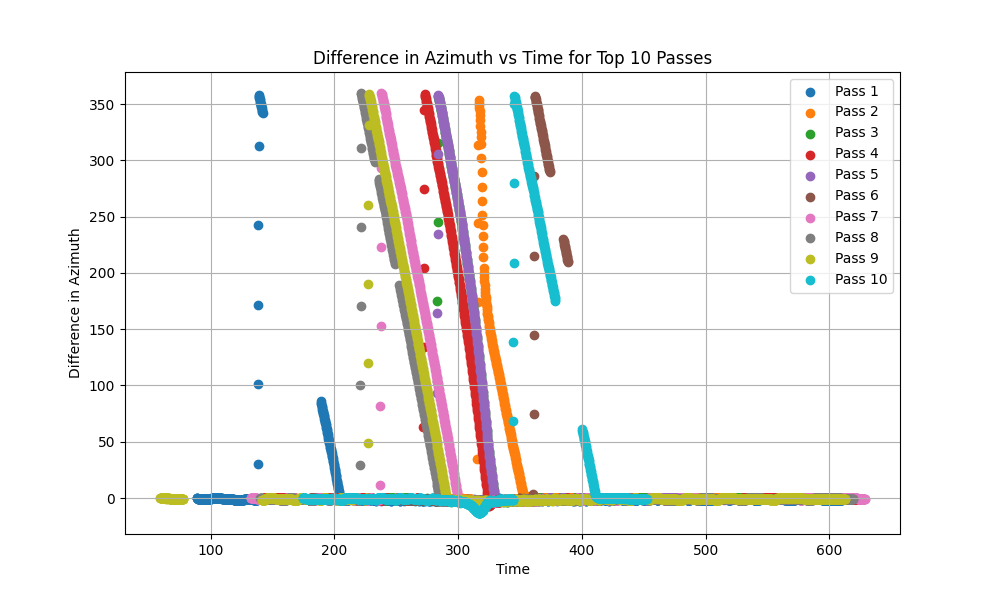

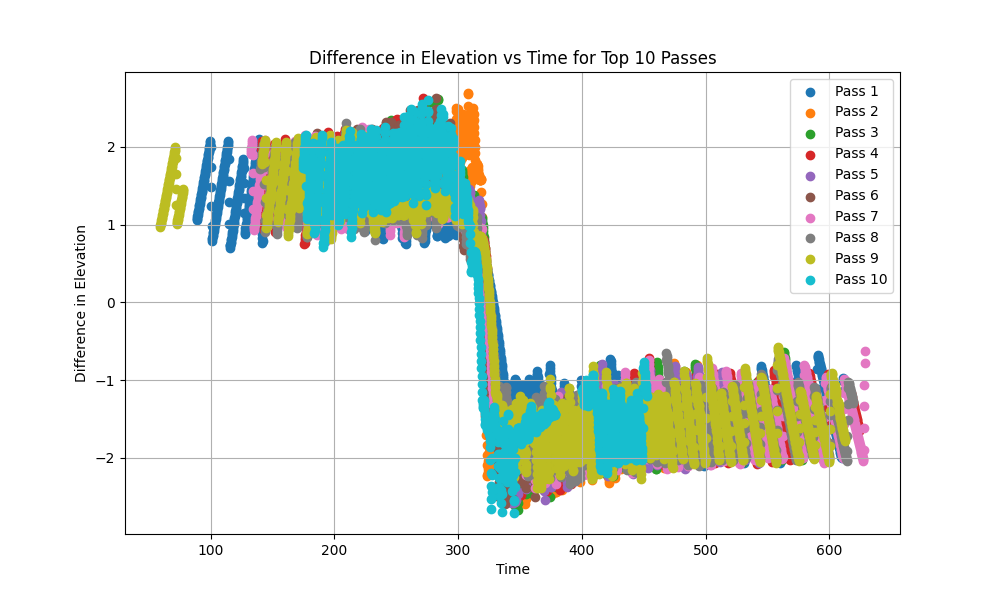

In [17]:
plt.figure(figsize=(10, 6))
# Loop through the top 10 objects and plot the pointing error vs elevation
for i, obj in enumerate(top_10_objects):
    plt.scatter(obj.time_ax,obj.station_obj.set_azimuth-obj.station_obj.azimuth, label=f'Pass {i+1}')

plt.xlabel('Time')
plt.ylabel('Difference in Azimuth')
plt.title('Difference in Azimuth vs Time for Top 10 Passes')
plt.legend()
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))
# Loop through the top 10 objects and plot the pointing error vs elevation
for i, obj in enumerate(top_10_objects):
    plt.scatter(obj.time_ax,obj.station_obj.set_elevation-obj.station_obj.elevation, label=f'Pass {i+1}')

plt.xlabel('Time')
plt.ylabel('Difference in Elevation')
plt.title('Difference in Elevation vs Time for Top 10 Passes')
plt.legend()
plt.grid(True)
plt.show()

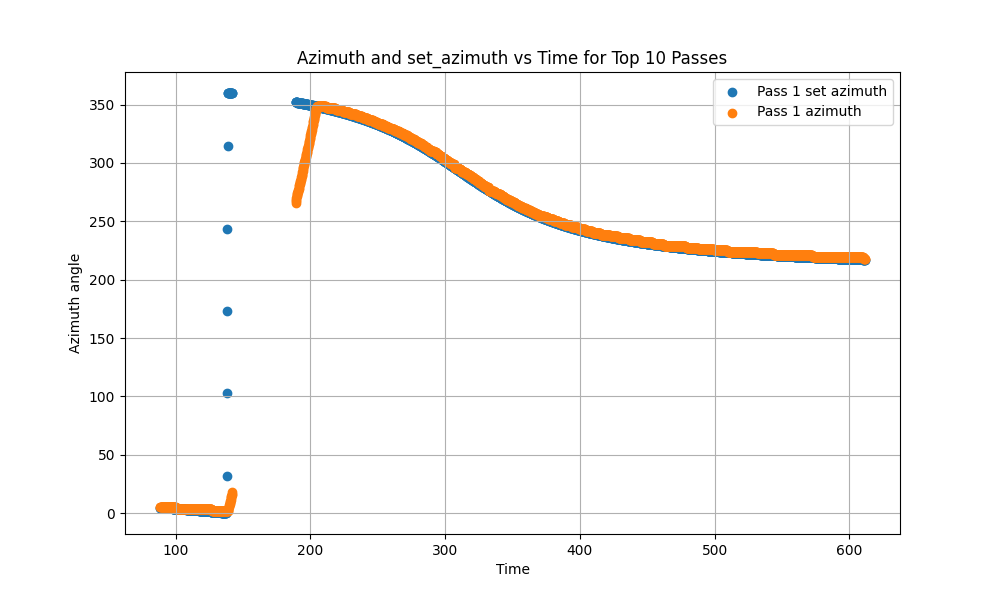

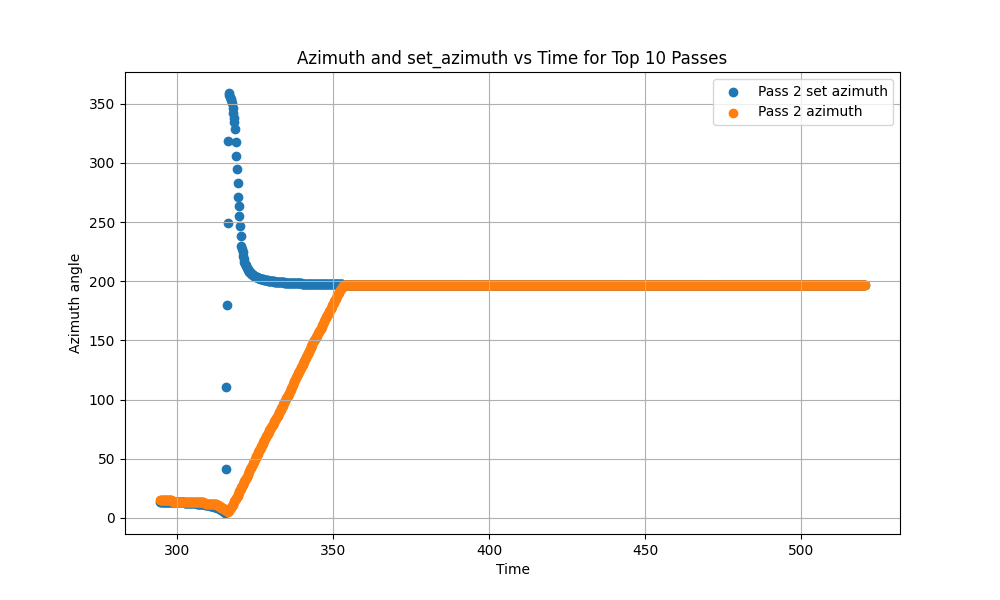

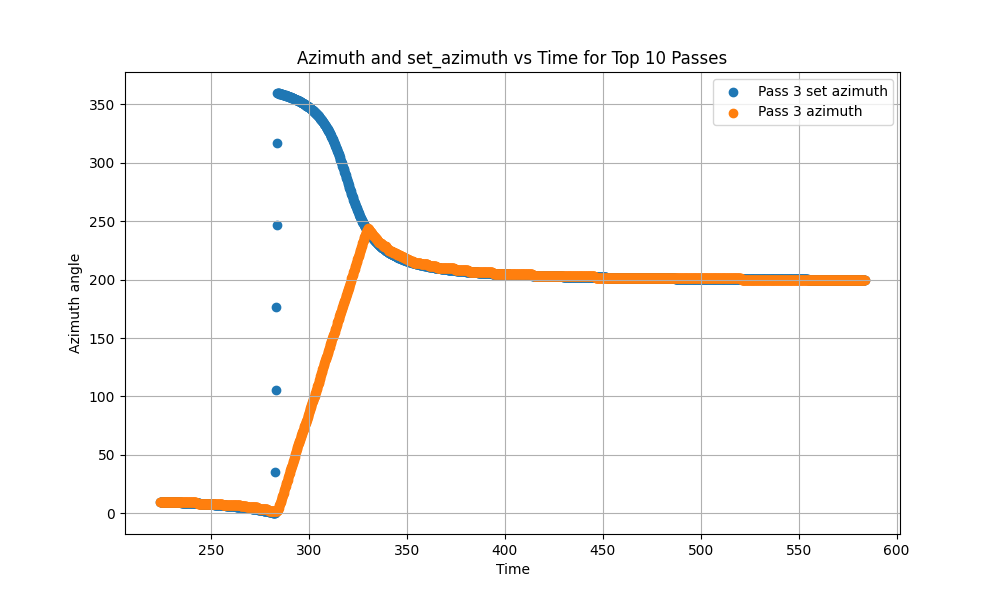

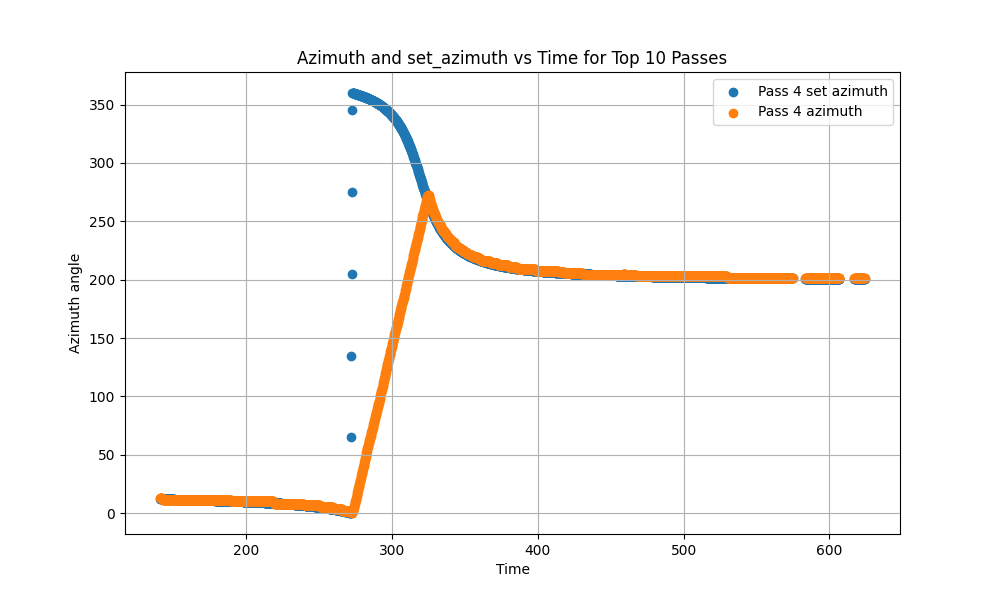

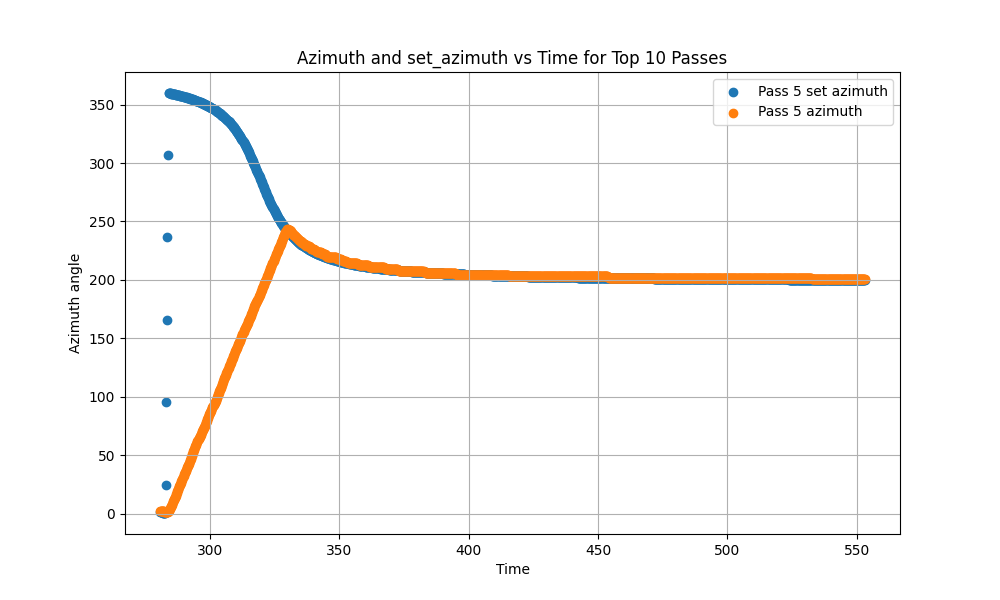

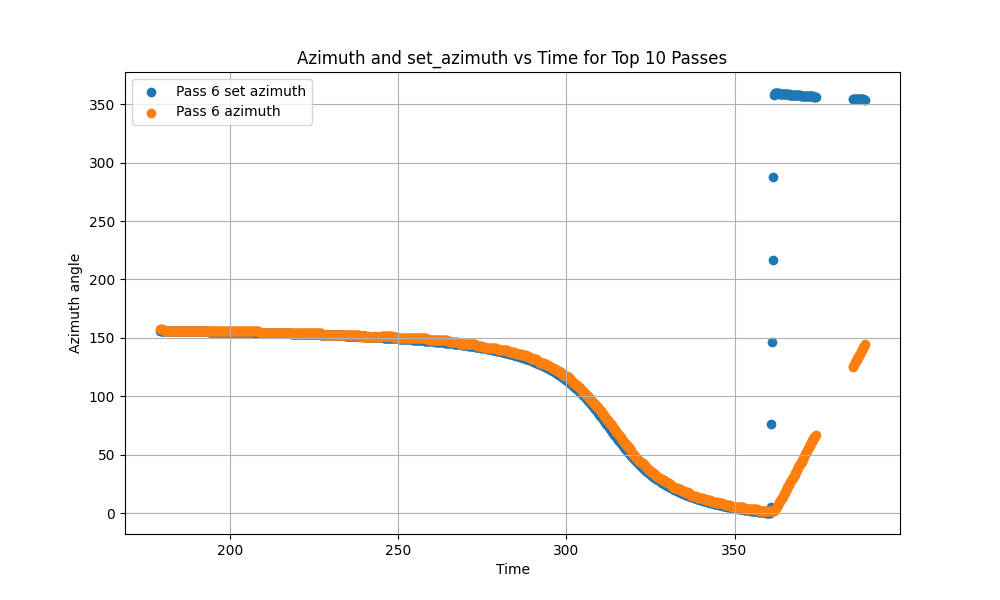

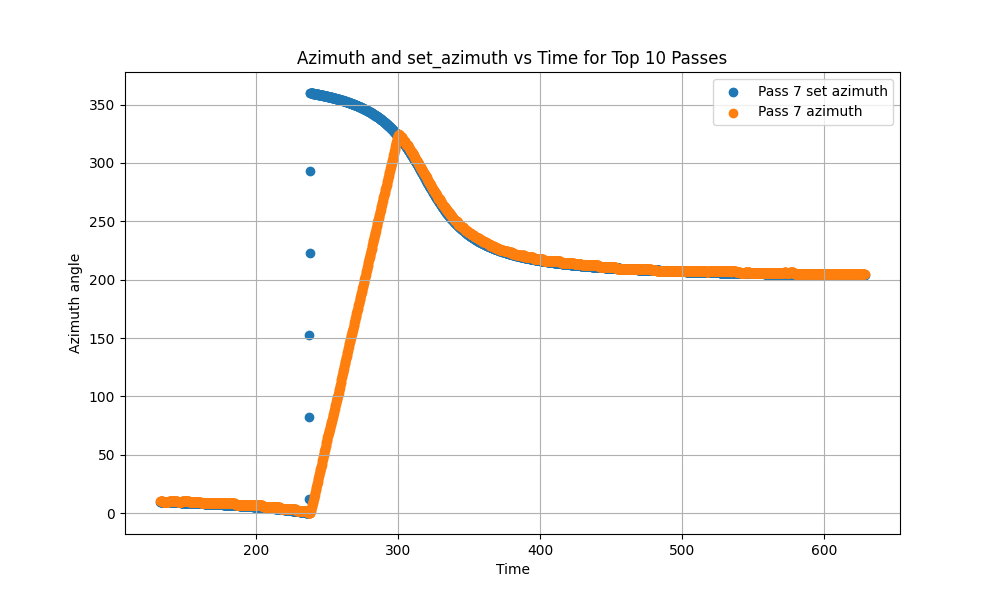

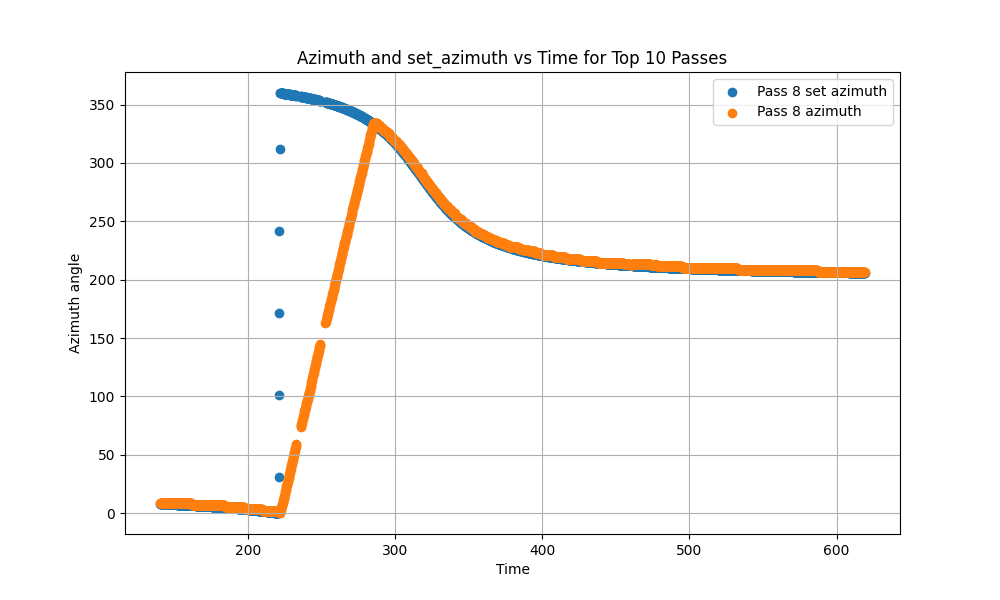

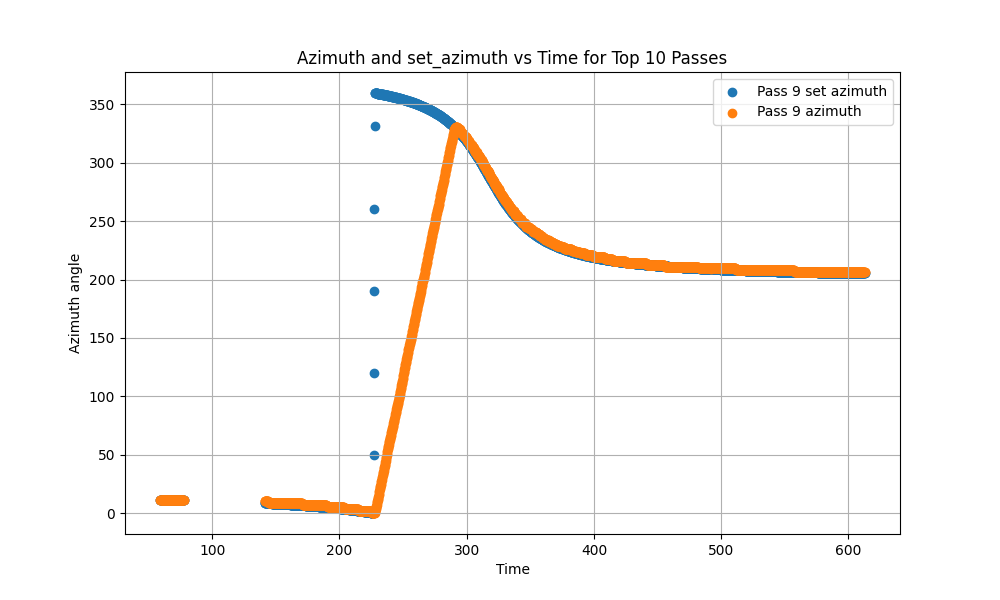

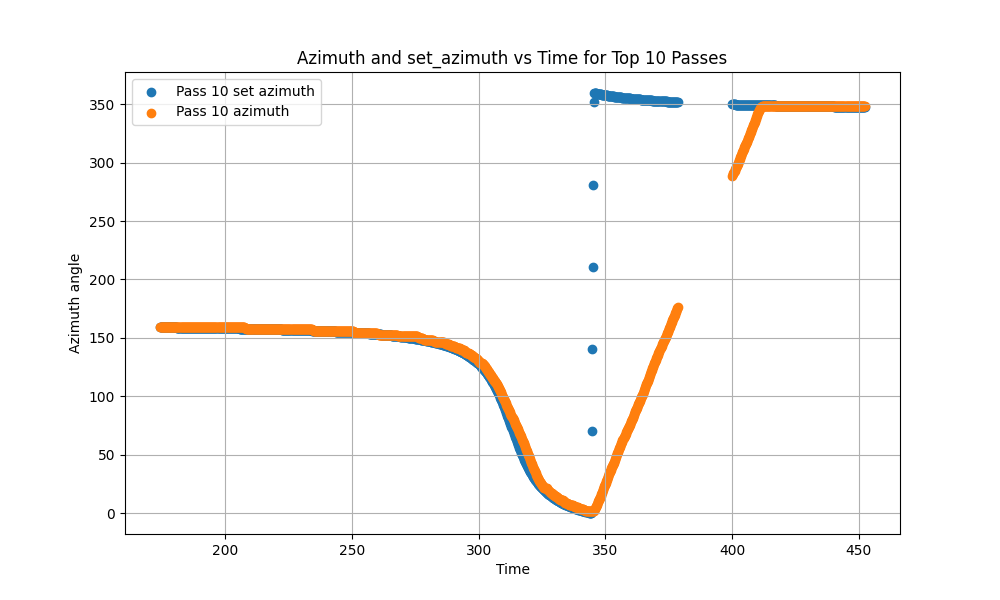

In [22]:

# Loop through the top 10 objects and plot the pointing error vs elevation
for i, obj in enumerate(top_10_objects):
    plt.figure(figsize=(10, 6))
    plt.scatter(obj.time_ax,obj.station_obj.set_azimuth, label=f'Pass {i+1} set azimuth')
    plt.scatter(obj.time_ax,obj.station_obj.azimuth, label=f'Pass {i+1} azimuth')
    plt.xlabel('Time')
    plt.ylabel('Azimuth angle')
    plt.title('Azimuth and set_azimuth vs Time for Top 10 Passes')
    plt.legend()
    plt.grid(True)
    plt.show()



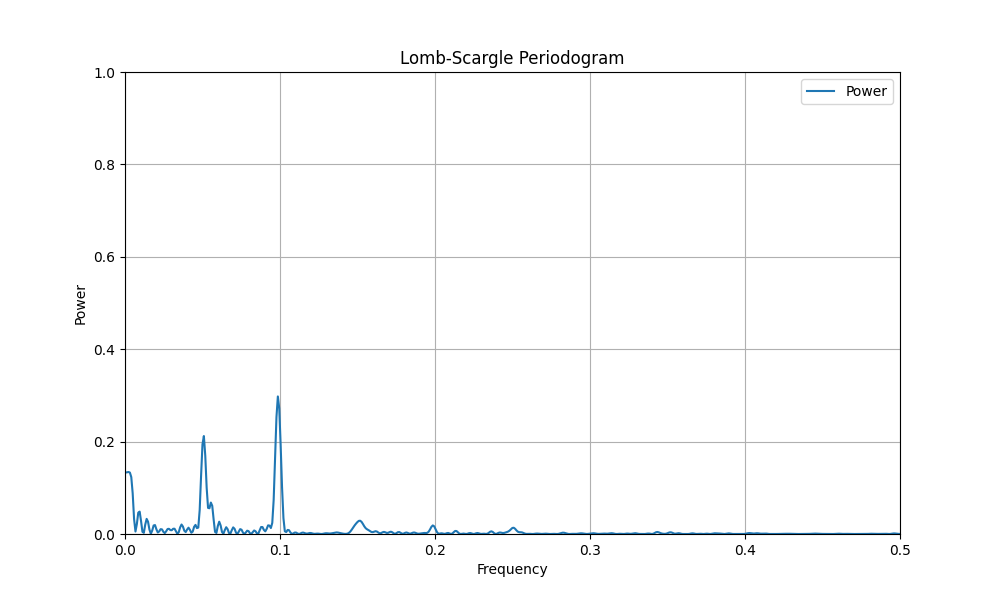

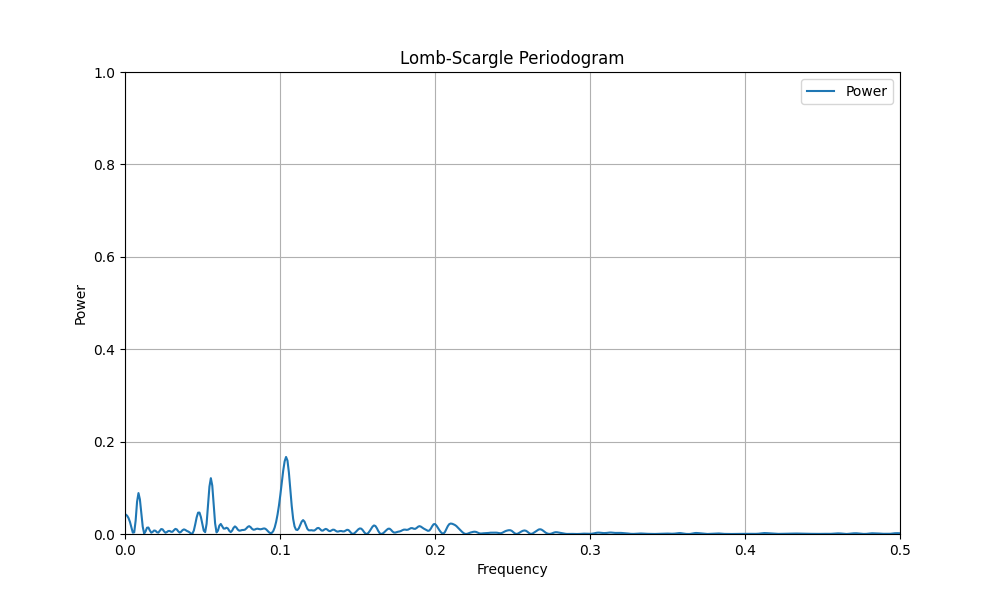

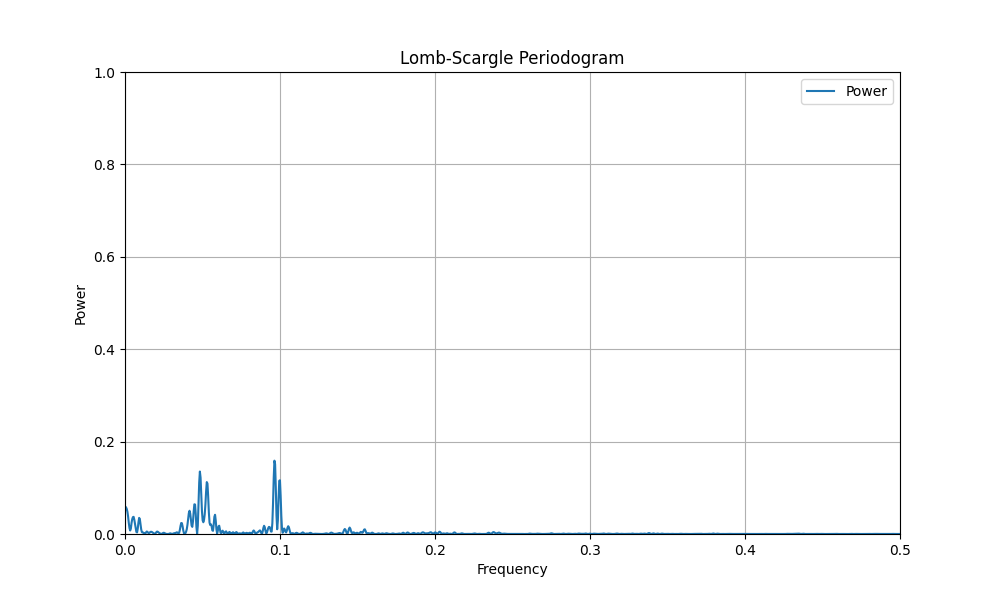

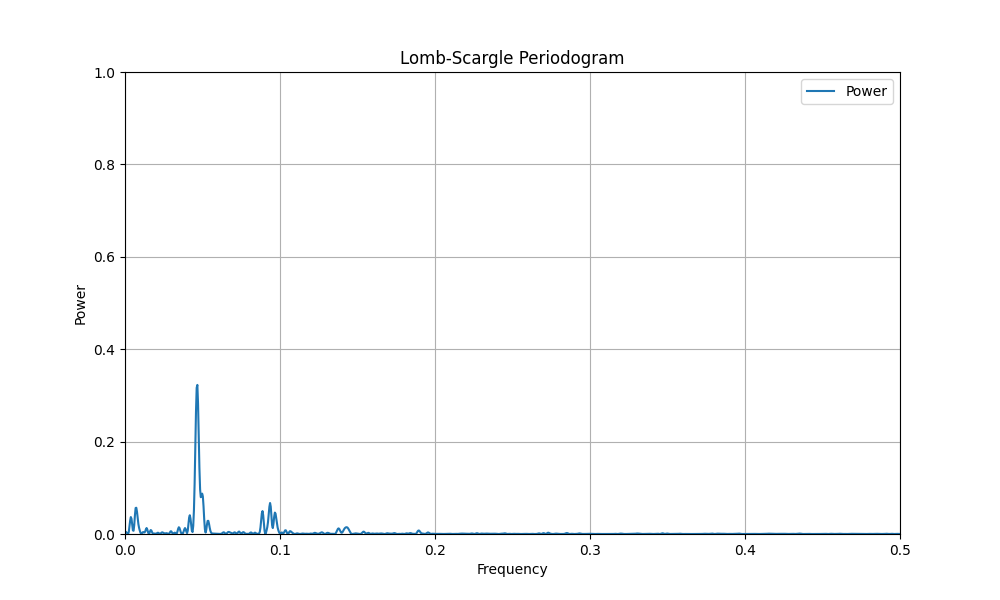

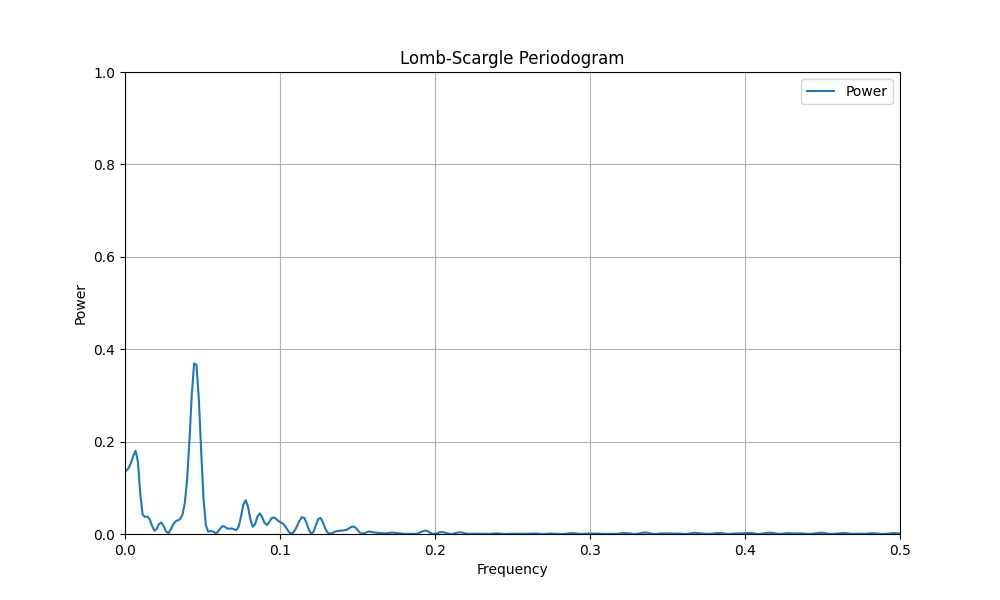

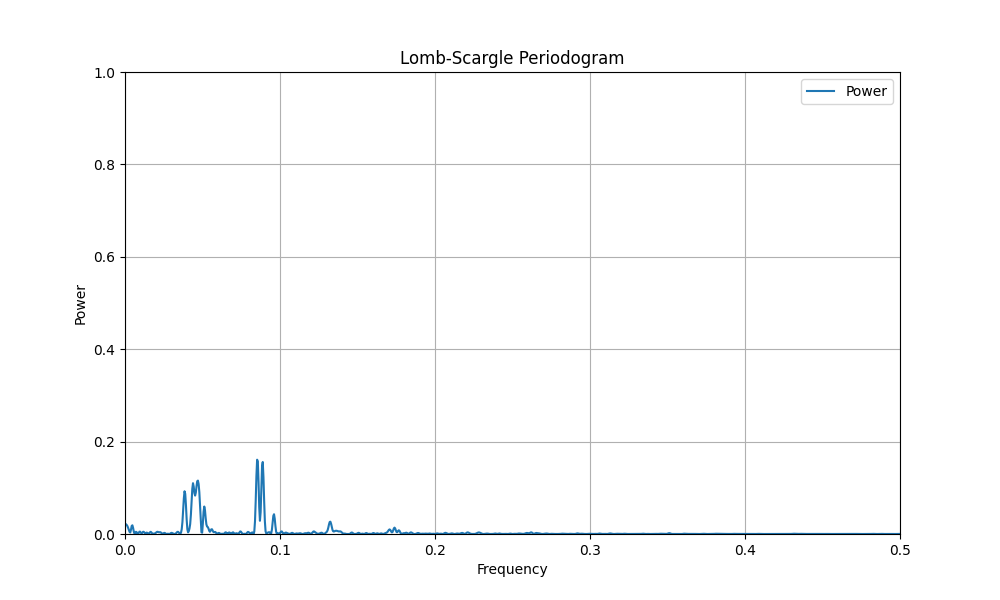

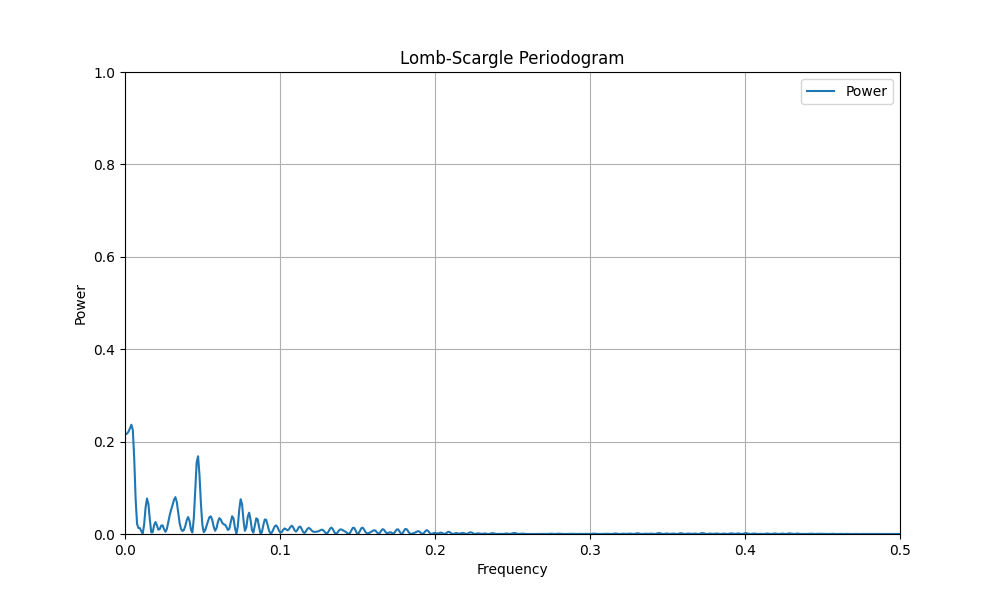

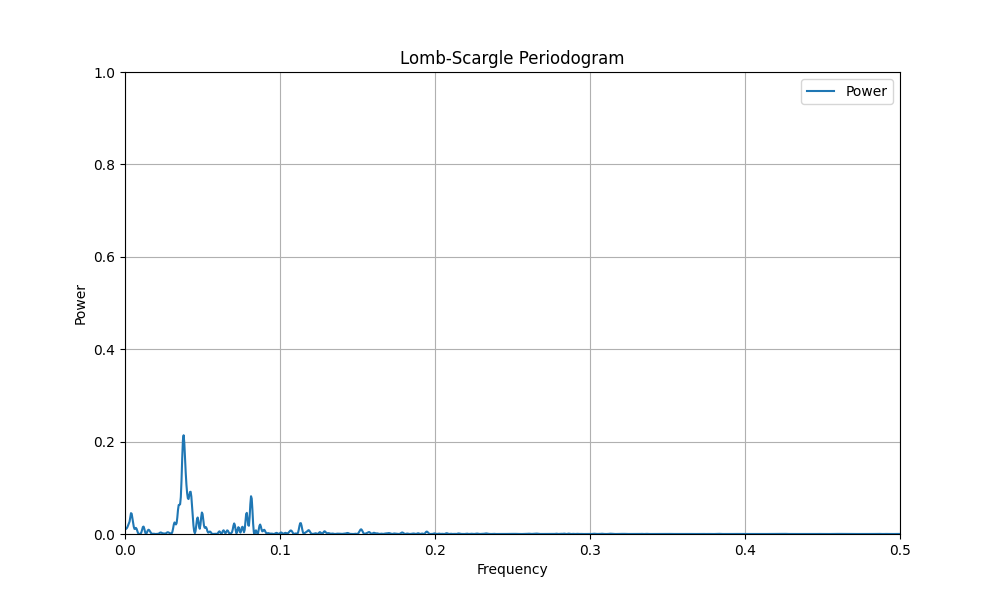

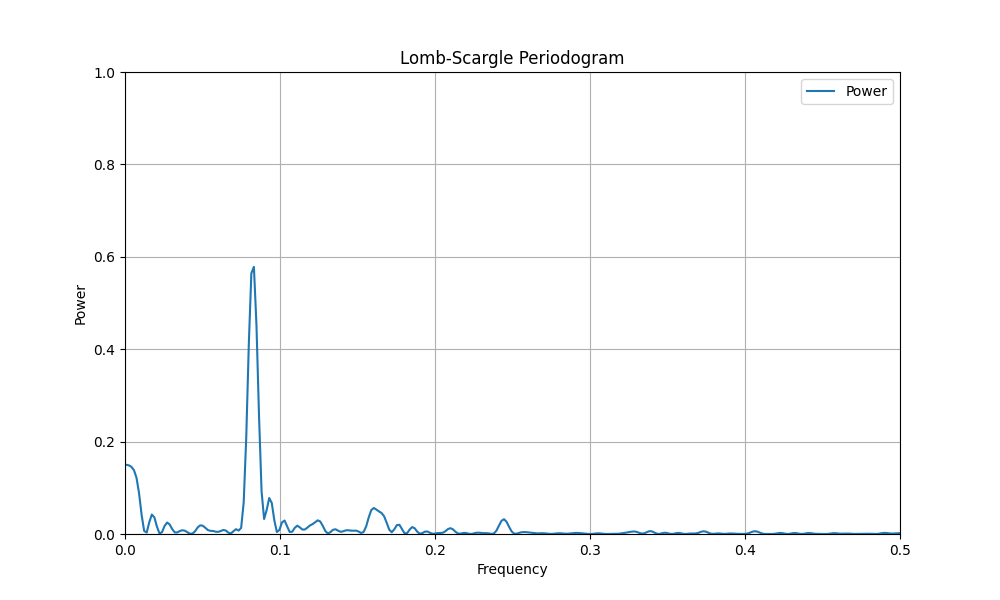

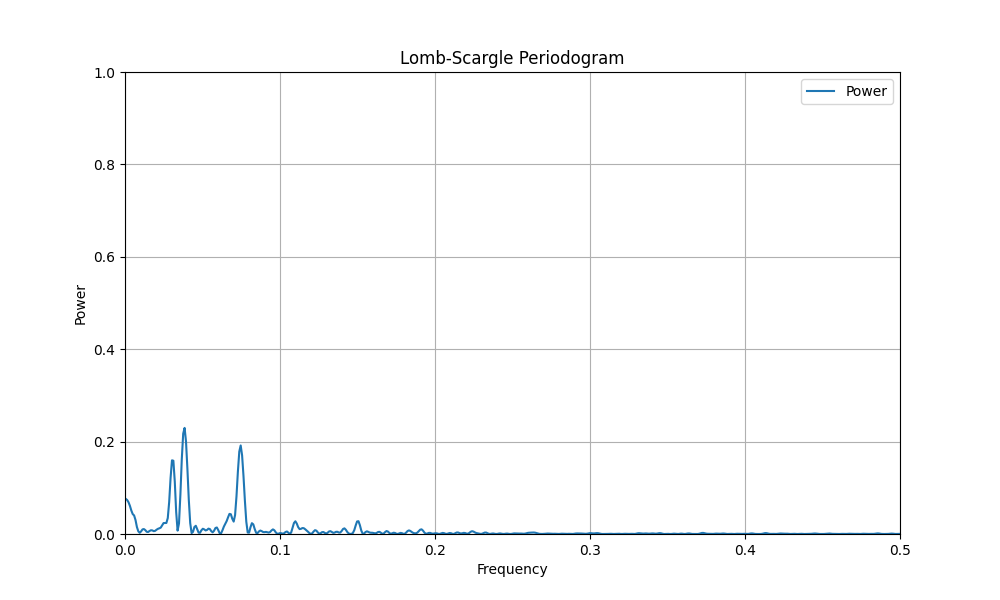

In [38]:
from astropy.timeseries import LombScargle
time=obj_act[0].time_ax.flatten()
values=obj_act[0].clean_sig_abs.flatten()
frequency, power = LombScargle(time, values).autopower()

for obj in obj_act[:10]:
    plt.figure(figsize=(10, 6))
    time=obj.time_ax.flatten()
    values=obj.clean_sig_abs.flatten()
    frequency, power = LombScargle(time, values).autopower(normalization='standard')
    plt.plot(frequency, power)
    plt.xlim(0, 0.5)
    plt.ylim(0, 1)
    plt.xlabel('Frequency')
    plt.ylabel('Power')
    plt.title('Lomb-Scargle Periodogram')
    plt.legend(['Power'])
    plt.grid(True)
    plt.show()


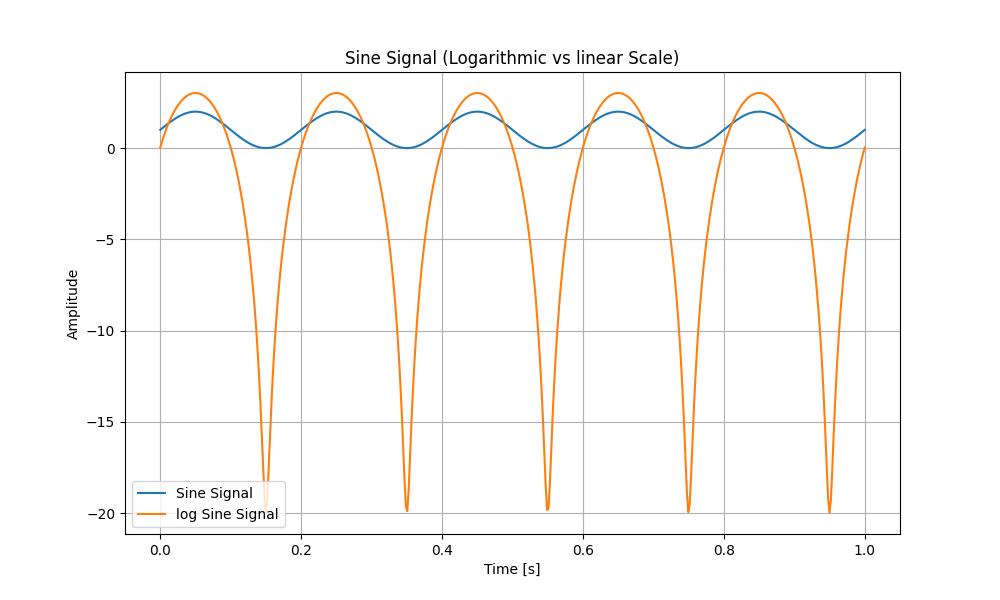

In [47]:
# Generate a sine signal
t = np.linspace(0, 1, 500)  # Time vector
frequency = 5  # Frequency of the sine wave
amplitude = 1  # Amplitude of the sine wave
sine_signal = 1.01+amplitude * np.sin(2 * np.pi * frequency * t)

# Plot the sine signal in linear scale
plt.figure(figsize=(10, 6))
plt.plot(t, sine_signal, label='Sine Signal')

plt.plot(t, 10*np.log10(sine_signal), label='log Sine Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Sine Signal (Logarithmic vs linear Scale)')
plt.legend()
plt.grid(True)
plt.show()

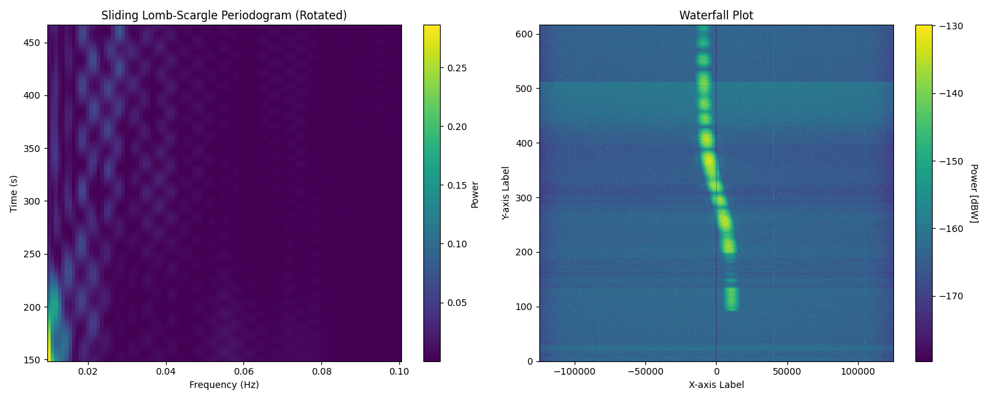

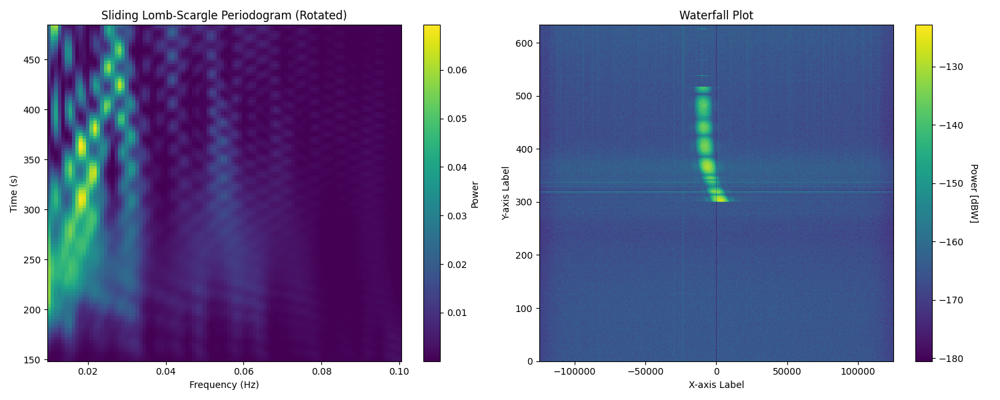

MemoryError: Unable to allocate 396. MiB for an array with shape (3164, 4096, 4) and data type float64

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

MemoryError: Unable to allocate 99.1 MiB for an array with shape (3172, 4095) and data type float64

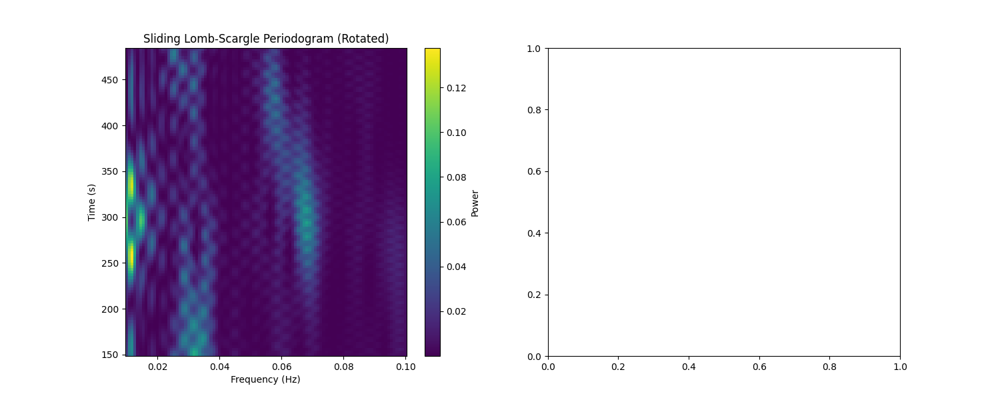

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.timeseries import LombScargle
from scipy.signal import windows

for obj in obj_act_top10[:4]:
    # Example time-series data (time and values)
    time = obj.time_ax.flatten()
    values = obj.clean_sig_abs.flatten()

    # Parameters
    window_length = 300  # Length of each window in seconds
    overlap_ratio = 0.99  # 50% overlap
    min_frequency = 0.01  # Minimum frequency for Lomb-Scargle
    max_frequency = 0.1   # Maximum frequency for Lomb-Scargle
    frequency_resolution = 100  # Number of frequency points

    # Calculate step size based on overlap
    step_size = window_length * (1 - overlap_ratio)

    # Sliding windows
    start_times = np.arange(time[0], time[-1] - window_length, step_size)
    frequencies = np.linspace(min_frequency, max_frequency, frequency_resolution)

    # Initialize results
    time_centers = []
    power_spectra = []

    for start_time in start_times:
        # Define the current window
        end_time = start_time + window_length
        mask = (time >= start_time) & (time < end_time)
        window_time = time[mask]
        window_values = values[mask]
        
        if len(window_time) > 0:
            # Apply Hamming window
            hamming_weights = windows.hamming(len(window_time))
            weighted_values = window_values * hamming_weights
            
            # Perform Lomb-Scargle analysis
            ls = LombScargle(window_time, weighted_values,normalization='standard')
            power = ls.power(frequencies)
            
            # Store results
            time_centers.append((start_time + end_time) / 2)
            power_spectra.append(power)

    # Convert results to numpy arrays
    time_centers = np.array(time_centers)
    power_spectra = np.array(power_spectra)


    # Set up the figure with two subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Plot 1: Sliding Lomb-Scargle Periodogram (Rotated)
    im1 = axes[0].pcolormesh(frequencies, time_centers, power_spectra, shading='auto', cmap='viridis')
    axes[0].set_xlabel('Frequency (Hz)')
    axes[0].set_ylabel('Time (s)')
    axes[0].set_title('Sliding Lomb-Scargle Periodogram (Rotated)')
    fig.colorbar(im1, ax=axes[0], label='Power')

    # Optional: Invert axes if needed
    # axes[0].invert_yaxis()
    # axes[0].invert_xaxis()

    # Plot 2: Waterfall plot (placeholder for obj_act_top10[0].noise_obj.plot_waterfall())
    # Replace this with the actual method or logic of your object
    obj.noise_obj.plot_waterfall()

    # Customize subplot
    axes[1].set_title('Waterfall Plot')
    axes[1].set_xlabel('X-axis Label')  # Replace with actual label
    axes[1].set_ylabel('Y-axis Label')  # Replace with actual label

    # Show the combined plots
    plt.tight_layout()
    plt.show()

